# Moonpay hometask

In [184]:
import pandas as pd
import numpy as np
import os
from datetime import datetime, timezone
import duckdb
import plotly.express as px

In [3]:
pd.set_option('display.max_column', 500)

In [5]:
os.chdir('/Users/Davide/Downloads/Moonpay hometask')

# Loading data and overview

In [155]:
buy_txn_df = pd.read_csv('buy_transactions.csv')
sell_txn_df = pd.read_csv('sell_transactions.csv')
customers_df = pd.read_csv('customers.csv')

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/3855077475.py:1: DtypeWarning: Columns (6) have mixed types. Specify dtype option on import or set low_memory=False.
  buy_txn_df = pd.read_csv('buy_transactions.csv')


In [156]:
# Modify all dates to datetime
buy_txn_df['created_at'] = pd.to_datetime(buy_txn_df['created_at'], format="mixed")
buy_txn_df['updated_at'] = pd.to_datetime(buy_txn_df['updated_at'], format="mixed")
sell_txn_df['created_at'] = pd.to_datetime(sell_txn_df['created_at'], format="mixed")
sell_txn_df['updated_at'] = pd.to_datetime(sell_txn_df['updated_at'], format="mixed")
customers_df['created_at'] = pd.to_datetime(customers_df['created_at'], format="mixed")
customers_df['updated_at'] = pd.to_datetime(customers_df['updated_at'], format="mixed")

In [159]:
#Ranking customers and transactions by update date and keeping only most recent
customers_last_update = duckdb.query("""
SELECT * FROM (SELECT *, ROW_NUMBER () OVER(PARTITION BY customer_id ORDER BY updated_at DESC) AS RANK
FROM customers_df
) ranked
where RANK = 1
""").to_df()
customers_last_update.drop('RANK', axis=1, inplace=True)


buy_txn_last_update = duckdb.query("""
SELECT * FROM (SELECT *, ROW_NUMBER () OVER(PARTITION BY transaction_id ORDER BY updated_at DESC) AS RANK
FROM buy_txn_df
) ranked 
WHERE RANK = 1
""").to_df()
buy_txn_last_update.drop('RANK', axis=1, inplace=True)

sell_txn_last_update = duckdb.query("""
SELECT * FROM (SELECT *, ROW_NUMBER () OVER(PARTITION BY sell_transaction_id ORDER BY updated_at DESC) AS RANK
FROM sell_txn_df
) ranked
WHERE RANK = 1
""").to_df()
sell_txn_last_update.drop('RANK', axis=1, inplace=True)

#Joinign customer info into buy and sell dataframes
buy_customer_join = duckdb.query("""
SELECT b.*, c.created_at as customer_created_at, c.country
FROM buy_txn_last_update as b
LEFT JOIN customers_last_update as c on b.customer_id = c.customer_id
""").to_df()

sell_customer_join = duckdb.query("""
SELECT s.*, c.created_at as customer_created_at, c.country
FROM sell_txn_last_update as s
LEFT JOIN customers_last_update as c on s.customer_id = c.customer_id
""").to_df()

In [466]:
buy_customer_join.describe()

,gross_volume_usd,net_margin_usd
count,62376.000000,62376.000000
mean,551.011451,4.395394
std,1049.357332,16.575345
min,15.570000,0.000000
25%,70.460000,0.000000
50%,170.360000,0.000000
75%,504.517500,2.180000
max,14731.880000,393.310000


In [352]:
sell_customer_join.describe()

,gross_volume_usd,net_margin_usd
count,42553.000000,42553.000000
mean,264.029343,3.339178
std,844.136720,19.554473
min,0.230000,0.000000
25%,28.830000,0.000000
50%,83.980000,0.000000
75%,169.460000,0.940000
max,37088.300000,1278.490000


In [464]:
customers_last_update.describe()

,customer_id,created_at,updated_at,country
count,34666,34666,34666,34666
unique,34666,NaN,NaN,14
top,cd6497d7-9f6e-6236-aab5-4eb663a41ce4,NaN,NaN,COUNTRY A
freq,1,NaN,NaN,15514
mean,NaN,2023-04-25 03:12:49.727718+01:00,2023-04-27 05:23:20.148993+01:00,NaN
min,NaN,2023-02-25 16:23:09.446000+00:00,2023-02-25 17:05:30.299000+00:00,NaN
25%,NaN,2023-03-24 12:41:17.471500+00:00,2023-03-27 21:51:10.160500+01:00,NaN
50%,NaN,2023-04-26 00:43:29.672000+01:00,2023-04-29 01:17:33.982500+01:00,NaN
75%,NaN,2023-05-27 00:20:29.622750+01:00,2023-05-29 08:28:10.910000+01:00,NaN
max,NaN,2023-06-20 05:30:19.664000+01:00,2023-06-20 05:30:19.664000+01:00,NaN


/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/38314377.py:2: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



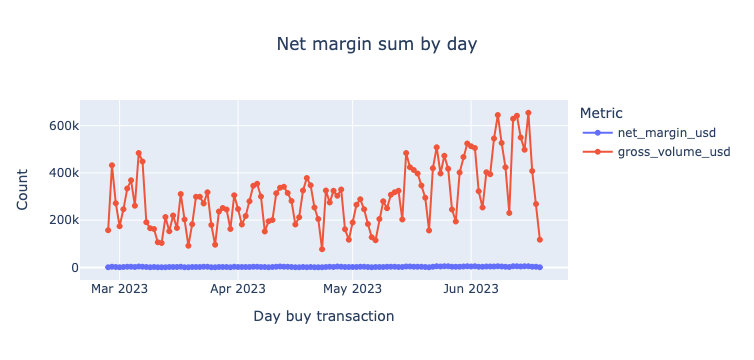

In [502]:
# Creating a new column to aggregate by month
buy_customer_join['day_created_at'] = buy_customer_join['created_at'].dt.to_period('D')

# Aggregating the results and calculating key statistics per month
result_df = buy_customer_join.groupby('day_created_at').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': 'sum',      # Sum gross_volume_usd
    'net_margin_usd': 'sum',        # Sum net_margin_usd
    
}).sort_values(by = 'day_created_at', ascending = True).reset_index()

# Transform new field into a string to create the required graph
result_df['day_created_at'] = result_df['day_created_at'].astype(str)

# Create the time line graph with the key metrics
fig1 = px.line(
    result_df,
    x='day_created_at',
    y=['net_margin_usd', 'gross_volume_usd'],
    markers=True,
    title='Net margin sum by day',
    labels={
        'day_created_at': 'Day buy transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig1.update_layout(
    title={'x': 0.5},
)

fig1.show()

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/1841063475.py:5: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



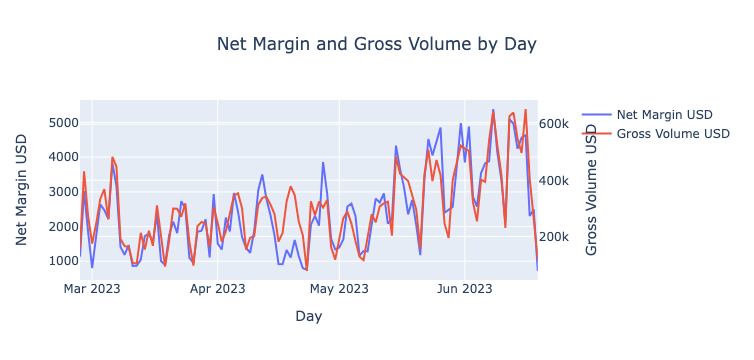

In [504]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Your existing code for data preparation remains the same
buy_customer_join['day_created_at'] = buy_customer_join['created_at'].dt.to_period('D')

result_df = buy_customer_join.groupby('day_created_at').agg({
    'transaction_id': 'nunique',
    'customer_id': 'nunique',
    'gross_volume_usd': 'sum',
    'net_margin_usd': 'sum',
}).sort_values(by='day_created_at', ascending=True).reset_index()

result_df['day_created_at'] = result_df['day_created_at'].astype(str)

# Create subplot with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=result_df['day_created_at'], y=result_df['net_margin_usd'], name="Net Margin USD"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=result_df['day_created_at'], y=result_df['gross_volume_usd'], name="Gross Volume USD"),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Net Margin and Gross Volume by Day",
    title_x=0.5
)

# Set x-axis title
fig.update_xaxes(title_text="Day")

# Set y-axes titles
fig.update_yaxes(title_text="Net Margin USD", secondary_y=False)
fig.update_yaxes(title_text="Gross Volume USD", secondary_y=True)

fig.show()


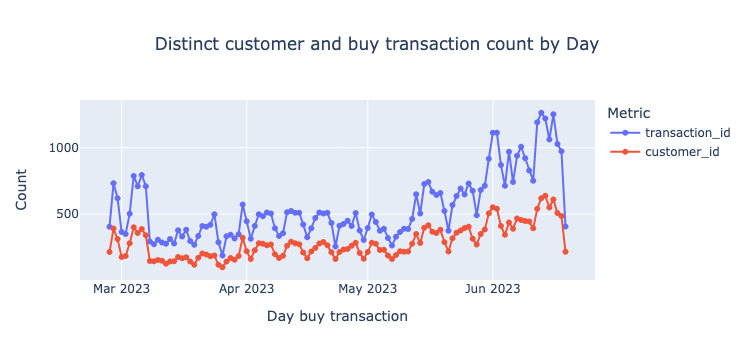

In [480]:
fig2 = px.line(
    result_df,
    x='day_created_at',
    y=['transaction_id', 'customer_id'],
    markers=True,
    title='Distinct customer and buy transaction count by day',
    labels={
        'day_created_at': 'Day buy transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig2.update_layout(
    title={'x': 0.5},
)

fig2.show()

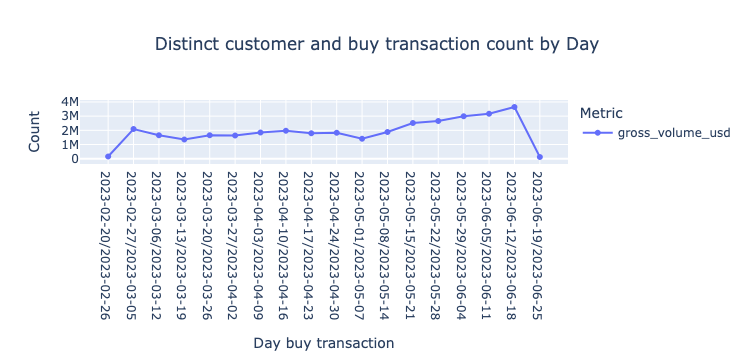

In [243]:
fig3 = px.line(
    result_df,
    x='day_created_at',
    y=['gross_volume_usd'],
    markers=True,
    title='Distinct customer and buy transaction count by Day',
    labels={
        'day_created_at': 'Day buy transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig3.update_layout(
    title={'x': 0.5},
)

fig3.show()

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/2128840472.py:2: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



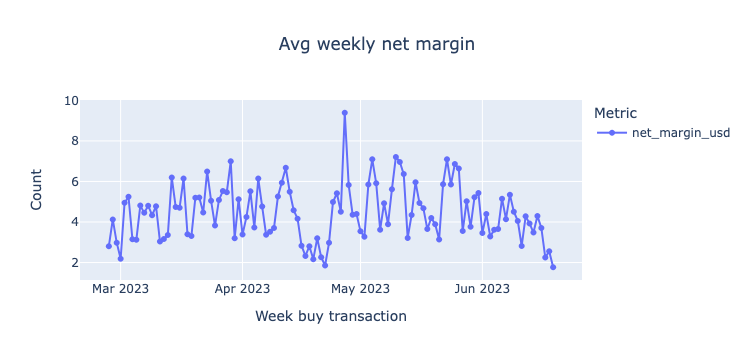

In [498]:
# Creating a new column to aggregate by month
buy_customer_join['day_created_at'] = buy_customer_join['created_at'].dt.to_period('D')

# Aggregating the results and calculating key statistics per month
result_df_mean = buy_customer_join.groupby('day_created_at').agg({
    'net_margin_usd': 'mean',        # Avg net_margin_usd
    
}).sort_values(by = 'day_created_at', ascending = True).reset_index()

# Transform new field into a string to create the required graph
result_df_mean['day_created_at'] = result_df_mean['day_created_at'].astype(str)

# Create the time line graph with the key metrics
fig4 = px.line(
    result_df_mean,
    x='day_created_at',
    y=['net_margin_usd'],
    markers=True,
    title='Avg weekly net margin',
    labels={
        'day_created_at': 'Week buy transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig4.update_layout(
    title={'x': 0.5},
)

fig4.show()

In [288]:
result = buy_customer_join.groupby('payment_method').agg({
    'transaction_id': 'nunique',             # Count distinct txn_id
    'customer_id': 'nunique',                # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'sum'), ascending = False)
result

transaction_id customer_id gross_volume_usd               \
                      nunique     nunique              sum         mean   
payment_method                                                            
BUY METHOD 1            58795       17419      31369578.01   533.541594   
BUY METHOD 3             2252        1472       2655166.76  1179.026092   
BUY OTHER                 445         122        159866.20   359.249888   
BUY METHOD 2              884         342        185279.30   209.591968   

               net_margin_usd            
                          sum      mean  
payment_method                           
BUY METHOD 1        257113.84  4.373056  
BUY METHOD 3         13081.69  5.808921  
BUY OTHER             2315.65  5.203708  
BUY METHOD 2          1655.93  1.873224

# Failed transactions

In [290]:
result = buy_customer_join.groupby('transaction_status').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'sum'), ascending = False)
result

transaction_id customer_id gross_volume_usd             \
                          nunique     nunique              sum       mean   
transaction_status                                                          
COMPLETED                   22945        9939       9593559.41  418.11111   
FAILED                      39431       13148      24776330.86  628.34650   

                   net_margin_usd             
                              sum       mean  
transaction_status                            
COMPLETED               274167.11  11.948883  
FAILED                       0.00   0.000000

In [333]:
result = buy_customer_join.groupby('failure_reason').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('transaction_id', 'nunique'), ascending = False)
result

transaction_id customer_id gross_volume_usd  \
                                 nunique     nunique              sum   
failure_reason                                                          
PAYMENT FAILURE 2                  26585        9556      16729999.99   
RISK SCREENING FAILURE 1            6690        3329       4028007.99   
CUSTOMER DRIVEN FAILURE 3           3890        2698       2020956.56   
PAYMENT FAILURE 4                    812         634       1022067.04   
BUY FAILURE REASON OTHER             718         493        334522.43   
PAYMENT FAILURE 3                    376         260        296337.97   
CUSTOMER DRIVEN FAILURE 4            118          96        124988.86   
PAYMENT FAILURE 1                    107          90         86610.54   
DELIVERY FAILURE 1                    93          80        101836.53   
RISK SCREENING FAILURE 3              29          25         23216.20   
CUSTOMER DRIVEN FAILURE 1              9           6          2775.69   
CUSTOMER DRIVEN FAILURE 2              4           4          5011.06   

                                       net_margin_usd       
                                  mean            sum mean  
failure_reason                                              
PAYMENT FAILURE 2           629.302238            0.0  0.0  
RISK SCREENING FAILURE 1    602.093870            0.0  0.0  
CUSTOMER DRIVEN FAILURE 3   519.526108            0.0  0.0  
PAYMENT FAILURE 4          1258.703251            0.0  0.0  
BUY FAILURE REASON OTHER    465.908677            0.0  0.0  
PAYMENT FAILURE 3           788.132899            0.0  0.0  
CUSTOMER DRIVEN FAILURE 4  1059.227627            0.0  0.0  
PAYMENT FAILURE 1           809.444299            0.0  0.0  
DELIVERY FAILURE 1         1095.016452            0.0  0.0  
RISK SCREENING FAILURE 3    800.558621            0.0  0.0  
CUSTOMER DRIVEN FAILURE 1   308.410000            0.0  0.0  
CUSTOMER DRIVEN FAILURE 2  1252.765000            0.0  0.0

In [336]:
#Filtering only completed transactions
completed_buy_customer_join = buy_customer_join[buy_customer_join['transaction_status'] == 'COMPLETED']

result = completed_buy_customer_join.groupby('payment_method').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('transaction_id', 'nunique'), ascending = False)
result

transaction_id customer_id gross_volume_usd               \
                      nunique     nunique              sum         mean   
payment_method                                                            
BUY METHOD 1            21665        9245       8688845.23   401.054476   
BUY METHOD 3              746         526        791376.93  1060.826984   
BUY METHOD 2              354         151         61959.69   175.027373   
BUY OTHER                 180          76         51377.56   285.430889   

               net_margin_usd             
                          sum       mean  
payment_method                            
BUY METHOD 1        257113.84  11.867706  
BUY METHOD 3         13081.69  17.535777  
BUY METHOD 2          1655.93   4.677768  
BUY OTHER             2315.65  12.864722

In [344]:
#Filtering only failed transactions
failed_buy_customer_join = buy_customer_join[buy_customer_join['transaction_status'] == 'FAILED']

result = failed_buy_customer_join.groupby('payment_method').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('transaction_id', 'nunique'), ascending = False)
result

transaction_id customer_id gross_volume_usd               \
                      nunique     nunique              sum         mean   
payment_method                                                            
BUY METHOD 1            37130       12204      22680732.78   610.846560   
BUY METHOD 3             1506        1078       1863789.83  1237.576248   
BUY METHOD 2              530         232        123319.61   232.678509   
BUY OTHER                 265          90        108488.64   409.391094   

               net_margin_usd       
                          sum mean  
payment_method                      
BUY METHOD 1              0.0  0.0  
BUY METHOD 3              0.0  0.0  
BUY METHOD 2              0.0  0.0  
BUY OTHER                 0.0  0.0

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/439810745.py:2: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



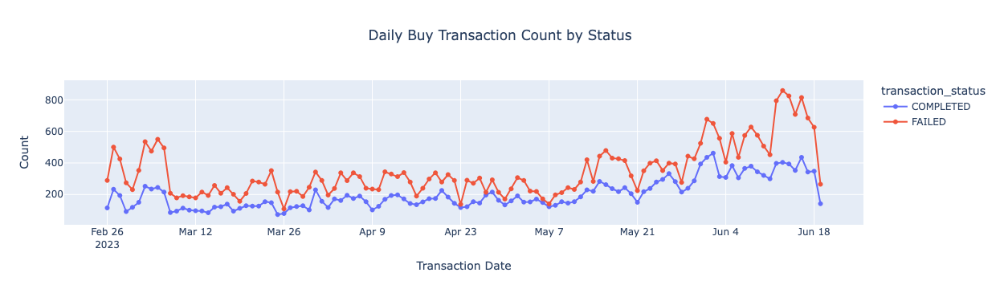

In [512]:
# Creating a new column to aggregate by month
buy_customer_join['day_created_at'] = buy_customer_join['created_at'].dt.to_period('D')

# Aggregating the results and calculating key statistics per month
result_df = buy_customer_join.groupby(['day_created_at', 'transaction_status']).agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': 'sum',      # Sum gross_volume_usd
    'net_margin_usd': 'sum',        # Sum net_margin_usd
    
}).sort_values(by = ['day_created_at', 'transaction_status'], ascending = True).reset_index()

# Transform new field into a string to create the required graph
result_df['day_created_at'] = result_df['day_created_at'].astype(str)

# Create the time line graph with the key metrics
fig5 = px.line(
    result_df,
    x='day_created_at',
    y=['transaction_id'],
    color='transaction_status',
    markers=True,
    title='Daily Buy Transaction Count by Status',
    labels={
        'day_created_at': 'Transaction Date',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig5.update_layout(
    title={'x': 0.5},
)

fig5.show()

In [531]:
completed_buy_customer_join.describe()

,gross_volume_usd,net_margin_usd,customer_tenure_at_buy_time
count,22945.000000,22945.000000,2.294500e+04
mean,418.111110,11.948883,1.127850e+06
std,903.617092,25.625133,1.995445e+06
min,17.140000,0.300000,0.000000e+00
25%,60.710000,1.750000,2.329512e+04
50%,122.130000,3.600000,5.611930e+04
75%,339.350000,9.800000,1.280588e+06
max,14731.880000,393.310000,9.737012e+06


# Correlation

0.9744097519108929


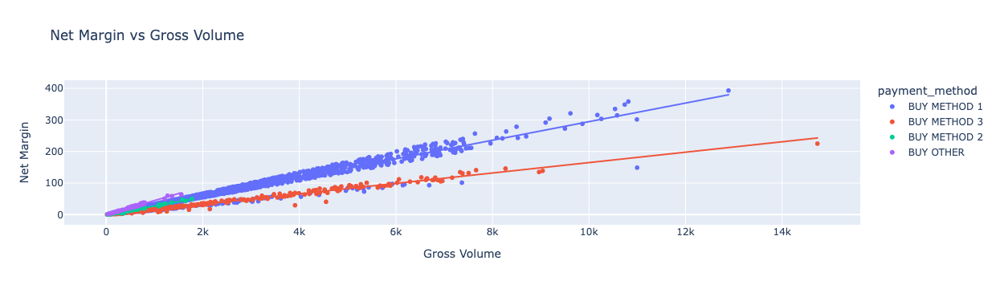

In [492]:
correlation = completed_buy_customer_join['net_margin_usd'].corr(completed_buy_customer_join['gross_volume_usd'])
print(correlation)

fig6 = px.scatter(
    completed_buy_customer_join,
    x='gross_volume_usd',
    y='net_margin_usd',
    color='payment_method',
    title='Net Margin vs Gross Volume',
    labels={'gross_volume_usd': 'Gross Volume', 'net_margin_usd': 'Net Margin'},
    trendline='ols' 
)

fig6.show()

# Country group by

In [348]:
result = completed_buy_customer_join.groupby('country').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'mean'), ascending = False)
result

transaction_id customer_id gross_volume_usd              \
                     nunique     nunique              sum        mean   
country                                                                 
COUNTRY I                648         295        366246.05  565.194522   
COUNTRY H                712         295        326671.32  458.808034   
COUNTRY B               1741         761        778246.77  447.011356   
COUNTRY F                938         438        420225.02  448.001087   
COUNTRY C               4138        1744       1785401.82  431.464915   
COUNTRY D               1582         685        662691.47  418.894735   
COUNTRY A              10117        4474       4183744.03  413.536031   
COUNTRY OTHER            235          98         87094.00  370.612766   
COUNTRY E                876         386        327845.41  374.252751   
COUNTRY G                714         319        260549.91  364.915840   
COUNTRY J                824         272        265718.29  322.473653   
COUNTRY K                141          63         45263.63  321.018652   
COUNTRY L                 99          53         30405.39  307.125152   
COUNTRY M                180          56         53456.30  296.979444   

              net_margin_usd             
                         sum       mean  
country                                  
COUNTRY I           10618.33  16.386312  
COUNTRY H            9414.55  13.222683  
COUNTRY B           22199.59  12.751057  
COUNTRY F           11915.40  12.702985  
COUNTRY C           50313.10  12.158797  
COUNTRY D           18955.16  11.981770  
COUNTRY A          119702.69  11.831837  
COUNTRY OTHER        2577.89  10.969745  
COUNTRY E            9408.43  10.740217  
COUNTRY G            7608.14  10.655658  
COUNTRY J            7678.88   9.319029  
COUNTRY K            1293.88   9.176454  
COUNTRY L             901.94   9.110505  
COUNTRY M            1579.13   8.772944

In [350]:
result = completed_buy_customer_join.groupby('country').agg({
    'transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'sum'), ascending = False)
result

transaction_id customer_id gross_volume_usd              \
                     nunique     nunique              sum        mean   
country                                                                 
COUNTRY A              10117        4474       4183744.03  413.536031   
COUNTRY C               4138        1744       1785401.82  431.464915   
COUNTRY B               1741         761        778246.77  447.011356   
COUNTRY D               1582         685        662691.47  418.894735   
COUNTRY F                938         438        420225.02  448.001087   
COUNTRY I                648         295        366246.05  565.194522   
COUNTRY H                712         295        326671.32  458.808034   
COUNTRY E                876         386        327845.41  374.252751   
COUNTRY J                824         272        265718.29  322.473653   
COUNTRY G                714         319        260549.91  364.915840   
COUNTRY OTHER            235          98         87094.00  370.612766   
COUNTRY M                180          56         53456.30  296.979444   
COUNTRY K                141          63         45263.63  321.018652   
COUNTRY L                 99          53         30405.39  307.125152   

              net_margin_usd             
                         sum       mean  
country                                  
COUNTRY A          119702.69  11.831837  
COUNTRY C           50313.10  12.158797  
COUNTRY B           22199.59  12.751057  
COUNTRY D           18955.16  11.981770  
COUNTRY F           11915.40  12.702985  
COUNTRY I           10618.33  16.386312  
COUNTRY H            9414.55  13.222683  
COUNTRY E            9408.43  10.740217  
COUNTRY J            7678.88   9.319029  
COUNTRY G            7608.14  10.655658  
COUNTRY OTHER        2577.89  10.969745  
COUNTRY M            1579.13   8.772944  
COUNTRY K            1293.88   9.176454  
COUNTRY L             901.94   9.110505

# Customer tenure

-0.024420612149859383


/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/3079125784.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



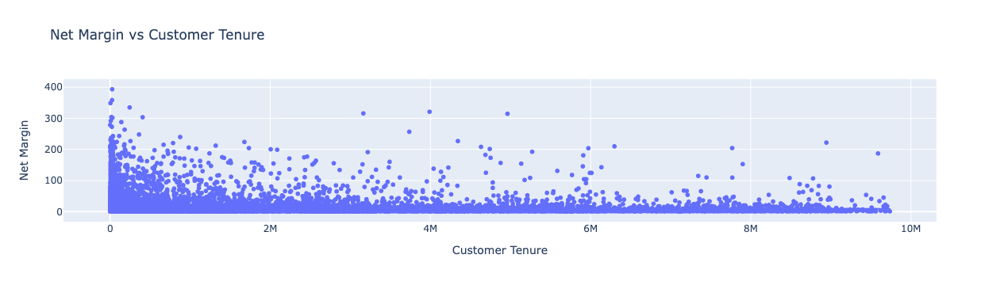

In [386]:
completed_buy_customer_join['customer_tenure_at_buy_time'] = ((completed_buy_customer_join['created_at'] - completed_buy_customer_join['customer_created_at']).dt.total_seconds()) #round(2)
correlation = completed_buy_customer_join['net_margin_usd'].corr(completed_buy_customer_join['customer_tenure_at_buy_time'])
print(correlation)

fig7 = px.scatter(
    completed_buy_customer_join,
    x='customer_tenure_at_buy_time',
    y='net_margin_usd',
    title='Net Margin vs Customer Tenure',
    labels={'customer_tenure_at_buy_time': 'Customer Tenure', 'net_margin_usd': 'Net Margin'},
    trendline='ols'

fig7.show()

# Sell metrics

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/880229091.py:2: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



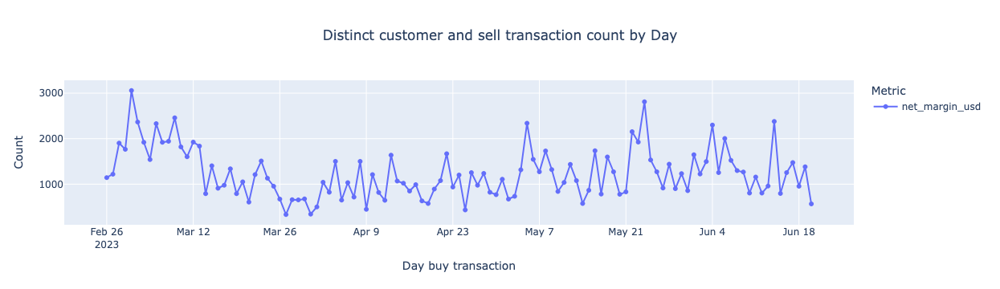

In [470]:
# Creating a new column to aggregate by month
sell_customer_join['day_created_at'] = sell_customer_join['created_at'].dt.to_period('D')

# Aggregating the results and calculating key statistics per month
result_df = sell_customer_join.groupby('day_created_at').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',            # Count distinct customer_id
    'gross_volume_usd': 'sum',           # Sum gross_volume_usd
    'net_margin_usd': 'sum',             # Sum net_margin_usd    
}).sort_values(by = 'day_created_at', ascending = True).reset_index()

# Transform new field into a string to create the required graph
result_df['day_created_at'] = result_df['day_created_at'].astype(str)

# Create the time line graph with the key metrics
fig8 = px.line(
    result_df,
    x='day_created_at',
    y=['net_margin_usd'],
    markers=True,
    title='Distinct customer and sell transaction count by Day',
    labels={
        'day_created_at': 'Day buy transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig8.update_layout(
    title={'x': 0.5},
)

fig8.show()

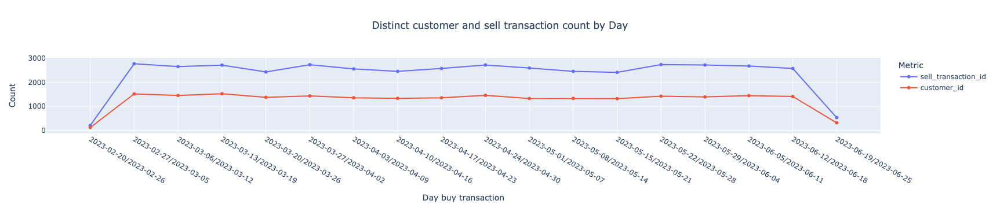

In [394]:
fig9 = px.line(
    result_df,
    x='day_created_at',
    y=['sell_transaction_id', 'customer_id'],
    markers=True,
    title='Distinct customer and sell transaction count by Day',
    labels={
        'day_created_at': 'Week sell transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig9.update_layout(
    title={'x': 0.5},
)

fig9.show()

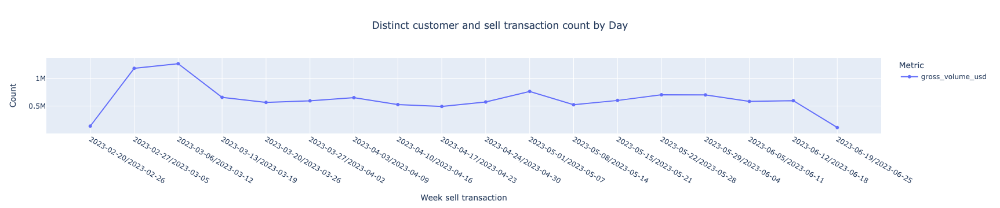

In [424]:
fig10 = px.line(
    result_df,
    x='day_created_at',
    y=['gross_volume_usd'],
    markers=True,
    title='Distinct customer and sell transaction count by Day',
    labels={
        'day_created_at': 'Week sell transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig10.update_layout(
    title={'x': 0.5},
)

fig10.show()

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/1712365366.py:2: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



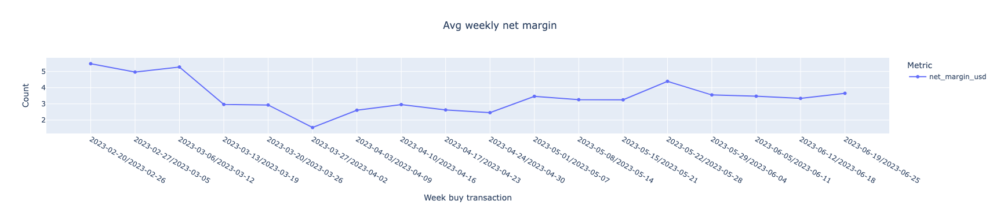

In [426]:
# Creating a new column to aggregate by month
sell_customer_join['day_created_at'] = sell_customer_join['created_at'].dt.to_period('W')

# Aggregating the results and calculating key statistics per month
result_df_mean = sell_customer_join.groupby('day_created_at').agg({
    'net_margin_usd': 'mean',        # Avg net_margin_usd
    
}).sort_values(by = 'day_created_at', ascending = True).reset_index()

# Transform new field into a string to create the required graph
result_df_mean['day_created_at'] = result_df_mean['day_created_at'].astype(str)

# Create the time line graph with the key metrics
fig11 = px.line(
    result_df_mean,
    x='day_created_at',
    y=['net_margin_usd'],
    markers=True,
    title='Avg weekly net margin',
    labels={
        'day_created_at': 'Week buy transaction',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig11.update_layout(
    title={'x': 0.5},
)

fig11.show()

In [410]:
result = sell_customer_join.groupby('payout_method').agg({
    'sell_transaction_id': 'nunique',             # Count distinct txn_id
    'customer_id': 'nunique',                # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'sum'), ascending = False)
result

sell_transaction_id customer_id gross_volume_usd              \
                          nunique     nunique              sum        mean   
payout_method                                                                
SELL METHOD 1               28968       11047       7085671.24  244.603398   
SELL METHOD 2               13046        5276       4081128.22  312.826017   
SELL OTHER                    539         309         68441.19  126.978089   

              net_margin_usd            
                         sum      mean  
payout_method                           
SELL METHOD 1       95515.47  3.297275  
SELL METHOD 2       45701.06  3.503071  
SELL OTHER            875.53  1.624360

In [412]:
result = sell_customer_join.groupby('sell_transaction_status').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'sum'), ascending = False)
result

sell_transaction_id customer_id gross_volume_usd  \
                                    nunique     nunique              sum   
sell_transaction_status                                                    
COMPLETED                             13914        7298       3485408.95   
FAILED                                28620       13259       7749477.87   
PENDING                                  19          19           353.83   

                                    net_margin_usd             
                               mean            sum       mean  
sell_transaction_status                                        
COMPLETED                250.496547      142092.06  10.212165  
FAILED                   270.771414           0.00   0.000000  
PENDING                   18.622632           0.00   0.000000

In [416]:
result = sell_customer_join.groupby('failure_reason').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('sell_transaction_id', 'nunique'), ascending = False)
result

sell_transaction_id customer_id  \
                                           nunique     nunique   
failure_reason                                                   
SELL CUSTOMER DRIVEN FAILURE 2               14711        7674   
SELL CUSTOMER DRIVEN FAILURE 3               12318        7145   
SELL FAILURE REASON OTHER                      884         498   
ORDER PROCESSING FAILURE 1                     236         200   
PAYOUT FAILURE 2                               219         178   
SELL CUSTOMER DRIVEN FAILURE 5                  93          83   
SELL CUSTOMER DRIVEN FAILURE 6                  89          74   
ORDER PROCESSING  FAILURE 2                     39          30   
ORDER PROCESSING FAILURE 3                      13          12   
SELL CUSTOMER DRIVEN FAILURE 4                  10           5   
PAYOUT FAILURE 1                                 4           3   
RISK SCREENING FAILURE 1                         4           3   

                               gross_volume_usd             net_margin_usd  \
                                            sum        mean            sum   
failure_reason                                                               
SELL CUSTOMER DRIVEN FAILURE 2       3988611.35  271.131218            0.0   
SELL CUSTOMER DRIVEN FAILURE 3       3375203.52  274.005806            0.0   
SELL FAILURE REASON OTHER             244117.26  276.150747            0.0   
ORDER PROCESSING FAILURE 1             51762.77  219.333771            0.0   
PAYOUT FAILURE 2                       50108.96  228.808037            0.0   
SELL CUSTOMER DRIVEN FAILURE 5         19550.89  210.224624            0.0   
SELL CUSTOMER DRIVEN FAILURE 6           863.87    9.706404            0.0   
ORDER PROCESSING  FAILURE 2            17953.56  460.347692            0.0   
ORDER PROCESSING FAILURE 3               134.85   10.373077            0.0   
SELL CUSTOMER DRIVEN FAILURE 4           586.28   58.628000            0.0   
PAYOUT FAILURE 1                         168.86   42.215000            0.0   
RISK SCREENING FAILURE 1                 415.70  103.925000            0.0   

                                     
                               mean  
failure_reason                       
SELL CUSTOMER DRIVEN FAILURE 2  0.0  
SELL CUSTOMER DRIVEN FAILURE 3  0.0  
SELL FAILURE REASON OTHER       0.0  
ORDER PROCESSING FAILURE 1      0.0  
PAYOUT FAILURE 2                0.0  
SELL CUSTOMER DRIVEN FAILURE 5  0.0  
SELL CUSTOMER DRIVEN FAILURE 6  0.0  
ORDER PROCESSING  FAILURE 2     0.0  
ORDER PROCESSING FAILURE 3      0.0  
SELL CUSTOMER DRIVEN FAILURE 4  0.0  
PAYOUT FAILURE 1                0.0  
RISK SCREENING FAILURE 1        0.0

In [433]:
#Filtering only completed transactions
completed_sell_customer_join = sell_customer_join[sell_customer_join['sell_transaction_status'] == 'COMPLETED']

result = completed_sell_customer_join.groupby('payout_method').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('sell_transaction_id', 'nunique'), ascending = False)
result

sell_transaction_id customer_id gross_volume_usd              \
                          nunique     nunique              sum        mean   
payout_method                                                                
SELL METHOD 1                9134        4818       2121056.04  232.215463   
SELL METHOD 2                4622        2499       1347068.94  291.447196   
SELL OTHER                    158         119         17283.97  109.392215   

              net_margin_usd             
                         sum       mean  
payout_method                            
SELL METHOD 1       95515.47  10.457135  
SELL METHOD 2       45701.06   9.887724  
SELL OTHER            875.53   5.541329

In [435]:
#Filtering only failed transactions
failed_sell_customer_join = sell_customer_join[sell_customer_join['sell_transaction_status'] == 'FAILED']

result = completed_sell_customer_join.groupby('payout_method').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('sell_transaction_id', 'nunique'), ascending = False)
result

sell_transaction_id customer_id gross_volume_usd              \
                          nunique     nunique              sum        mean   
payout_method                                                                
SELL METHOD 1                9134        4818       2121056.04  232.215463   
SELL METHOD 2                4622        2499       1347068.94  291.447196   
SELL OTHER                    158         119         17283.97  109.392215   

              net_margin_usd             
                         sum       mean  
payout_method                            
SELL METHOD 1       95515.47  10.457135  
SELL METHOD 2       45701.06   9.887724  
SELL OTHER            875.53   5.541329

/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/1840615973.py:2: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.



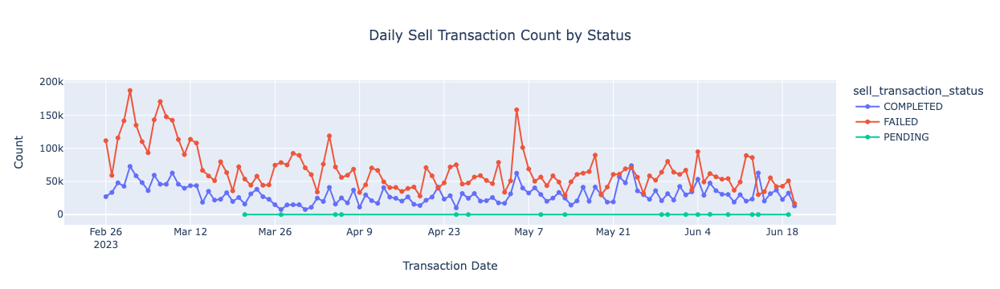

In [514]:
# Creating a new column to aggregate by month
sell_customer_join['day_created_at'] = sell_customer_join['created_at'].dt.to_period('D')

# Aggregating the results and calculating key statistics per month
result_df = sell_customer_join.groupby(['day_created_at', 'sell_transaction_status']).agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': 'sum',      # Sum gross_volume_usd
    'net_margin_usd': 'sum',        # Sum net_margin_usd
    
}).sort_values(by = ['day_created_at', 'sell_transaction_status'], ascending = True).reset_index()

# Transform new field into a string to create the required graph
result_df['day_created_at'] = result_df['day_created_at'].astype(str)

# Create the time line graph with the key metrics
fig12 = px.line(
    result_df,
    x='day_created_at',
    y=['gross_volume_usd'],
    color='sell_transaction_status',
    markers=True,
    title='Daily Sell Transaction Count by Status',
    labels={
        'day_created_at': 'Transaction Date',
        'value': 'Count',
        'variable': 'Metric'
    }
)

# Centering the title 
fig12.update_layout(
    title={'x': 0.5},
)

fig12.show()

In [533]:
completed_sell_customer_join.describe()

,gross_volume_usd,net_margin_usd,customer_tenure_at_sell_time
count,13914.000000,13914.000000,1.391400e+04
mean,250.496547,10.212165,1.154974e+06
std,845.233307,33.155439,1.957300e+06
min,0.230000,0.010000,0.000000e+00
25%,24.860000,1.012500,2.346000e+04
50%,74.075000,3.035000,7.110667e+04
75%,170.387500,7.140000,1.437220e+06
max,37088.300000,1278.490000,9.815799e+06


# Correlation

0.9884202513312811


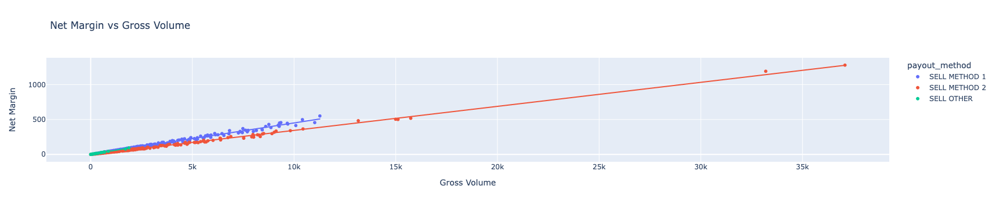

In [439]:
correlation = completed_sell_customer_join['net_margin_usd'].corr(completed_sell_customer_join['gross_volume_usd'])
print(correlation)

# Assuming your DataFrame is named 'df' and contains 'net_margin' and 'gross_volume' columns
fig13 = px.scatter(
    completed_sell_customer_join,
    x='gross_volume_usd',
    y='net_margin_usd',
    color='payout_method',
    title='Net Margin vs Gross Volume',
    labels={'gross_volume_usd': 'Gross Volume', 'net_margin_usd': 'Net Margin'},
    trendline='ols'  # Optional: add a trendline
)

# Show the plot
fig13.show()

# Country group by

In [445]:
result = completed_sell_customer_join.groupby('country').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('net_margin_usd', 'mean'), ascending = False)
result

sell_transaction_id customer_id gross_volume_usd              \
                          nunique     nunique              sum        mean   
country                                                                      
COUNTRY M                      75          40         24050.05  320.667333   
COUNTRY J                     379         174        120755.25  318.615435   
COUNTRY B                    1133         614        316099.31  278.993213   
COUNTRY D                     931         474        246188.38  264.434350   
COUNTRY K                     119          55         30739.36  258.313950   
COUNTRY C                    2452        1367        655349.70  267.271493   
COUNTRY OTHER                 137          75         34088.42  248.820584   
COUNTRY G                     293         181         69042.36  235.639454   
COUNTRY A                    6364        3265       1528710.01  240.212132   
COUNTRY I                     402         200         97261.11  241.943060   
COUNTRY F                     478         289        112617.52  235.601506   
COUNTRY E                     559         299        131592.28  235.406583   
COUNTRY L                      72          38         16195.96  224.943889   
COUNTRY H                     520         227        102719.24  197.537000   

              net_margin_usd             
                         sum       mean  
country                                  
COUNTRY M            1014.80  13.530667  
COUNTRY J            4996.02  13.182111  
COUNTRY B           12709.41  11.217485  
COUNTRY D           10055.27  10.800505  
COUNTRY K            1273.96  10.705546  
COUNTRY C           26003.42  10.604984  
COUNTRY OTHER        1379.98  10.072847  
COUNTRY G            2940.38  10.035427  
COUNTRY A           62869.19   9.878880  
COUNTRY I            3898.10   9.696766  
COUNTRY F            4620.23   9.665753  
COUNTRY E            5395.13   9.651395  
COUNTRY L             630.40   8.755556  
COUNTRY H            4305.77   8.280327

In [529]:
result = failed_sell_customer_join.groupby('country').agg({
    'sell_transaction_id': 'nunique',    # Count distinct txn_id
    'customer_id': 'nunique',       # Count distinct customer_id
    'gross_volume_usd': ['sum','mean'],      # Sum gross_volume_usd
    'net_margin_usd': ['sum','mean'],        # Sum net_margin_usd
    
}).sort_values(by = ('sell_transaction_id', 'nunique'), ascending = False)
result

sell_transaction_id customer_id gross_volume_usd              \
                          nunique     nunique              sum        mean   
country                                                                      
COUNTRY A                   12611        5880       3281881.22  260.239570   
COUNTRY C                    5353        2500       1510340.85  282.148487   
COUNTRY B                    2368        1074        695192.53  293.577927   
COUNTRY D                    1839         865        464137.42  252.385764   
COUNTRY E                    1121         519        314752.44  280.778269   
COUNTRY F                    1083         518        232314.73  214.510369   
COUNTRY H                     952         392        281627.13  295.826817   
COUNTRY I                     842         396        194863.73  231.429608   
COUNTRY J                     838         368        353532.59  421.876599   
COUNTRY G                     784         381        207238.37  264.334656   
COUNTRY OTHER                 245         124         56987.81  232.603306   
COUNTRY K                     228          95         61165.15  268.268202   
COUNTRY L                     206          82         43333.83  210.358398   
COUNTRY M                     150          65         52110.07  347.400467   

              net_margin_usd       
                         sum mean  
country                            
COUNTRY A                0.0  0.0  
COUNTRY C                0.0  0.0  
COUNTRY B                0.0  0.0  
COUNTRY D                0.0  0.0  
COUNTRY E                0.0  0.0  
COUNTRY F                0.0  0.0  
COUNTRY H                0.0  0.0  
COUNTRY I                0.0  0.0  
COUNTRY J                0.0  0.0  
COUNTRY G                0.0  0.0  
COUNTRY OTHER            0.0  0.0  
COUNTRY K                0.0  0.0  
COUNTRY L                0.0  0.0  
COUNTRY M                0.0  0.0

# Customer tenure

-0.019742019436219897


/var/folders/cj/mjyzb9257zv77l3r38yxnslw0000gn/T/ipykernel_13275/165988171.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



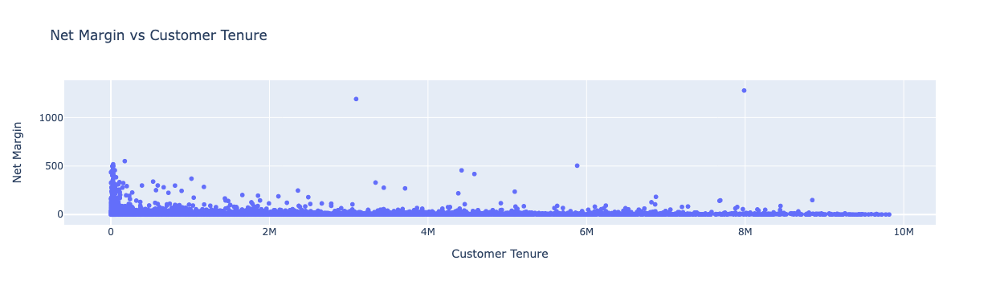

In [522]:
completed_sell_customer_join['customer_tenure_at_sell_time'] = ((completed_sell_customer_join['created_at'] - completed_sell_customer_join['customer_created_at']).dt.total_seconds()) #round(2)
correlation = completed_sell_customer_join['net_margin_usd'].corr(completed_sell_customer_join['customer_tenure_at_sell_time'])
print(correlation)

fig14 = px.scatter(
    completed_sell_customer_join,
    x='customer_tenure_at_sell_time',
    y='net_margin_usd',
    title='Net Margin vs Customer Tenure',
    labels={'customer_tenure_at_sell_time': 'Customer Tenure', 'net_margin_usd': 'Net Margin'},
    trendline='ols'
)

fig14.show()

# To do
- need to consider the avg net margin --> this could be an important KPI
- I seems there is  growth in volume, num txn, and num users
- Potentially look into those users who ONLY have failed transactions